*Unit 2, Sprint 2, Module 1*

---

# Decision Trees

- clean data with **outliers and missing values**
- use scikit-learn **pipelines**
- use scikit-learn for **decision trees**
- get and interpret **feature importances** of a tree-based model
- understand why decision trees are useful to model **non-linear, non-monotonic** relationships and **feature interactions**

### Setup

Run the code cell below. You can work locally (follow the [local setup instructions](https://lambdaschool.github.io/ds/unit2/local/)) or on Colab.

Libraries

- **category_encoders** 
- **graphviz**
- ipywidgets
- matplotlib
- numpy
- pandas
- **plotly**
- seaborn
- scikit-learn

In [293]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://github.com/skhabiri/PredictiveModeling-KaggleChallenge-u2s2/tree/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

# Clean data with outliers and missing values 🚰

## Overview

Real-world data is often dirty. [The Quartz guide to bad data](https://github.com/Quartz/bad-data-guide) is a "reference to problems seen in real-world data along with suggestions on how to resolve them." One of the common issues is ["Zeros replace missing values."](https://github.com/Quartz/bad-data-guide#zeros-replace-missing-values)

This is true of the Tanzania Waterpumps data, which we'll use throughout your Kaggle Challenge sprint:

> Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional, which need some repairs, and which don't work at all? Predict one of these three classes based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.


The Tanzania Waterpumps data has outliers and missing values. Let's start to clean it.

First, load & split data.

In [294]:
import pandas as pd
from sklearn.model_selection import train_test_split

train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

# Split train into train & val
train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              stratify=train['status_group'], random_state=42)

train.shape, val.shape, test.shape

((47520, 41), (11880, 41), (14358, 40))

This is a multi-class classification problem. The majority class occurs with 54% frequency.

In [295]:
train.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

In [296]:
# 'status_group' is the target
train['status_group'].value_counts(normalize=True)

functional                 0.543077
non functional             0.384238
functional needs repair    0.072685
Name: status_group, dtype: float64

One common issues is ["zeros replace missing values."](https://github.com/Quartz/bad-data-guide#zeros-replace-missing-values)

We can use [Pandas Profiling](https://github.com/pandas-profiling/pandas-profiling) to get a report, with warnings about frequent zeros, and much more!

In [297]:
from pandas_profiling import ProfileReport

#to_notebook_iframe() creates html report
profile = ProfileReport(train, minimal=True).to_notebook_iframe()

profile

Note that longitude has 3% zeros. Some of the locations are at ["Null Island"](https://en.wikipedia.org/wiki/Null_Island) instead of Tanzania.

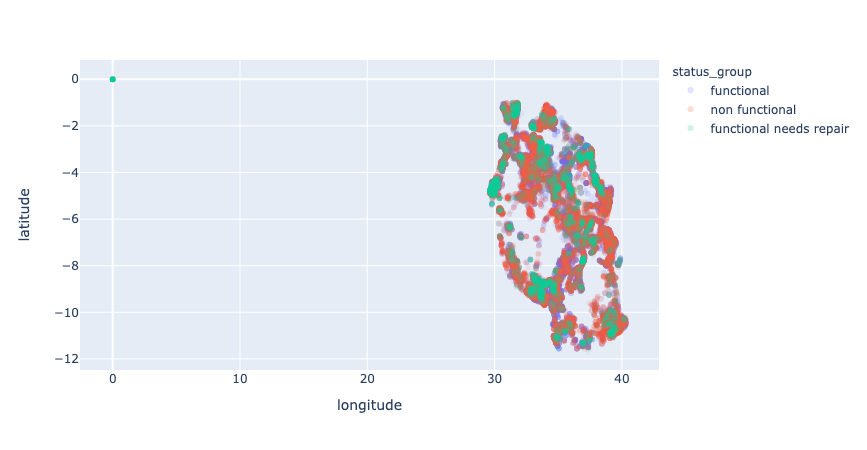

In [298]:
import plotly.express as px
px.scatter(train, x='longitude', y='latitude', color='status_group', opacity=0.1)

The latitude is approximately zero, but not exactly:

In [299]:
train[['longitude', 'latitude']].describe()

,longitude,latitude
count,47520.000000,4.752000e+04
mean,34.082431,-5.705946e+00
std,6.552053,2.941332e+00
min,0.000000,-1.164944e+01
25%,33.092142,-8.528215e+00
50%,34.910740,-5.021436e+00
75%,37.170578,-3.327185e+00
max,40.344301,-2.000000e-08


## Follow Along

#### Define a function to wrangle train, validate, and test sets in the same way.

Fix the location, and do more data cleaning and feature engineering.

In [300]:
# identify zero filled coordinates to convert then to np.nan
train[['latitude','longitude']][train['longitude']<1e-6].head()

,latitude,longitude
32604,-2.000000e-08,0.0
37113,-2.000000e-08,0.0
24948,-2.000000e-08,0.0
33079,-2.000000e-08,0.0
43390,-2.000000e-08,0.0


*Verify duplicates columns*

In [301]:
print(train[['quantity', 'quantity_group']].describe())
train[['quantity', 'quantity_group']].sample(10)

       quantity quantity_group
count     47520          47520
unique        5              5
top      enough         enough
freq      26567          26567


,quantity,quantity_group
34660,enough,enough
15035,insufficient,insufficient
665,enough,enough
43169,insufficient,insufficient
39272,insufficient,insufficient
52502,enough,enough
23227,insufficient,insufficient
27397,enough,enough
39678,dry,dry
43396,enough,enough


In [302]:
import numpy as np

def wrangle(X):
    """Wrangle train, validate, and test sets in the same way"""
    
    # Prevent SettingWithCopyWarning
    X = X.copy()
    
    # About 3% of the time, latitude has small values near zero,
    # outside Tanzania, so we'll treat these values like zero.
    X['latitude'] = X['latitude'].replace(-2e-08, 0)
    
    # When columns have zeros and shouldn't, they are like null values.
    # So we will replace the zeros with nulls, and impute missing values later.
    cols_with_zeros = ['longitude', 'latitude']
    for col in cols_with_zeros:
        X[col] = X[col].replace(0, np.nan)
            
    # quantity & quantity_group are duplicates, so drop one
    X = X.drop(columns='quantity_group')
    
    # return the wrangled dataframe
    return X


train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

Now the locations look better.

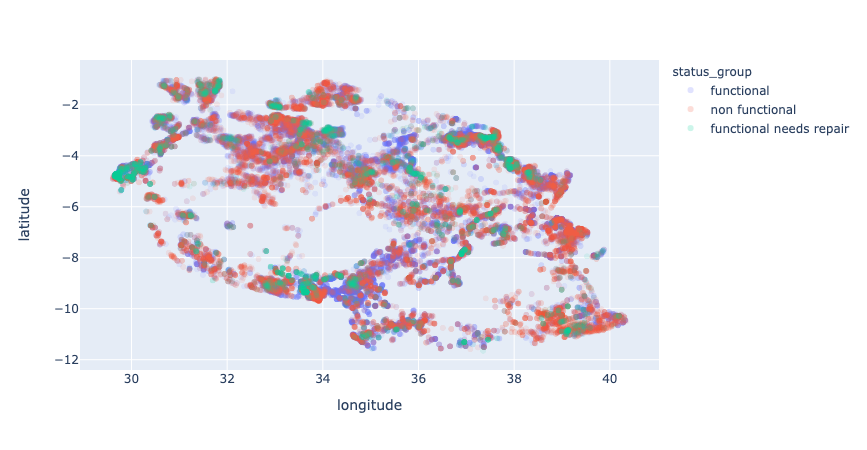

In [303]:
px.scatter(train, x='longitude', y='latitude', color='status_group', opacity=0.1)

### mapbox in plotly
By the way, you can also make maps with Plotly Express. For example:

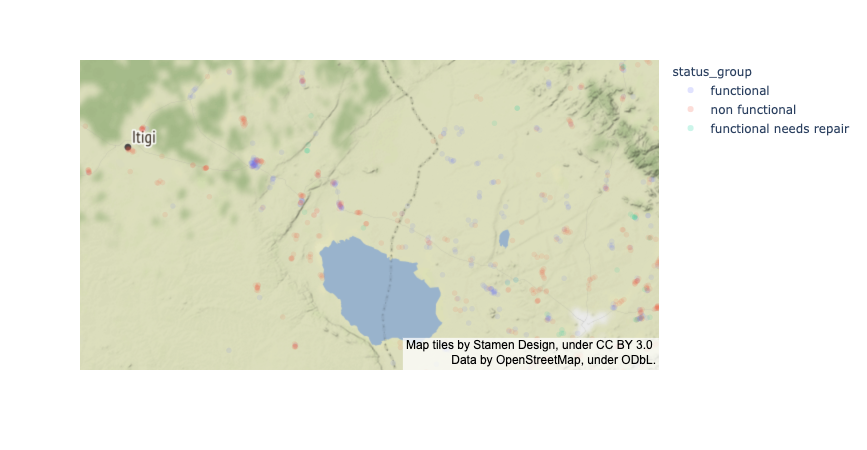

In [304]:
# https://plot.ly/python/mapbox-layers/#base-maps-in-layoutmapboxstyle
fig = px.scatter_mapbox(train, lat='latitude', lon='longitude', color='status_group', opacity=0.1)
fig.update_layout(mapbox_style='stamen-terrain')
fig.show()

#### Select features
We drop train['id'] a high cardinality feature with no predictive attribute

In [305]:
# The status_group column is the target
target = 'status_group'

# Get a dataframe with all train columns except the target & id
train_features = train.drop(columns=[target, 'id'])

# Get a list of the numeric features, convert index type to list
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

# Get a series with the cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

# Get a list of all categorical features with cardinality <= 50, convert index type to list
categorical_features = cardinality[cardinality <= 50].index.tolist()

# Combine the lists 
features = numeric_features + categorical_features
print(features)

['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year', 'basin', 'region', 'public_meeting', 'recorded_by', 'scheme_management', 'permit', 'extraction_type', 'extraction_type_group', 'extraction_type_class', 'management', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group']


In [306]:
# Arrange data into X features matrix and y target vector 
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]

## Challenge

For your Kaggle Challenge, define a function to wrangle train, validate, and test sets in the same way. Clean outliers and engineer features. 

(For example, what other columns have zeros and shouldn't? What other columns are duplicates, or nearly duplicates? Can you extract the year from date_recorded? Can you engineer new features, such as the number of years from waterpump construction to waterpump inspection?)

# Use scikit-learn pipelines

## Overview

We can combine steps with pipelines: Encode, Impute, Scale, Fit, Predict!

[The Scikit-Learn User Guide explains why pipelines are useful](https://scikit-learn.org/stable/modules/compose.html), and demonstrates how to use them.

> Pipeline can be used to chain multiple estimators into one. This is useful as there is often a fixed sequence of steps in processing the data, for example feature selection, normalization and classification. Pipeline serves multiple purposes here:
> - **Convenience and encapsulation.** You only have to call fit and predict once on your data to fit a whole sequence of estimators.
> - **Joint parameter selection.** You can grid search over parameters of all estimators in the pipeline at once.
> - **Safety.** Pipelines help avoid leaking statistics from your test data into the trained model in cross-validation, by ensuring that the same samples are used to train the transformers and predictors.

#### Just for comparison's sake, here's preprocessing + Logistic Regression _without_ using a pipeline

Here's the documentation for each step in the process:

- https://contrib.scikit-learn.org/category_encoders/onehot.html
- https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html
- https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
- https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

In [307]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

encoder = ce.OneHotEncoder(use_cat_names=True)
imputer = SimpleImputer()
scaler = StandardScaler()
model = LogisticRegression(max_iter=1000)

X_train_encoded = encoder.fit_transform(X_train)
X_train_imputed = imputer.fit_transform(X_train_encoded)
X_train_scaled = scaler.fit_transform(X_train_imputed)
model.fit(X_train_scaled, y_train)

X_val_encoded = encoder.transform(X_val)
X_val_imputed = imputer.transform(X_val_encoded)
X_val_scaled = scaler.transform(X_val_imputed)
print('Validation Accuracy', model.score(X_val_scaled, y_val))

X_test_encoded = encoder.transform(X_test)
X_test_imputed = imputer.transform(X_test_encoded)
X_test_scaled = scaler.transform(X_test_imputed)
y_pred = model.predict(X_test_scaled)

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Validation Accuracy 0.730976430976431


## Follow Along

#### Pipelines can help you write more concise code with fewer errors!

Let's rewrite the code cell above, but with a pipeline.

https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.make_pipeline.html

In [308]:
%timeit
from sklearn.pipeline import make_pipeline

"""
pipeline is a list of tuples with string name and object instance for each step. 
make_pipleline passes each step instance object as an argument to the makepipleline function.
makepipline uses lowercase function name for each step as the string name step. string name 
step acts like a dictionary key for .named_steps attribute to access the step instance.
"""
pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(strategy='mean'), 
    StandardScaler(), 
    LogisticRegression(multi_class='auto', solver='lbfgs', n_jobs=-1)
)

# Fit on train
pipeline.fit(X_train, y_train)

# Score on validation
print ('Validation Accruacy', pipeline.score(X_val, y_val))

# Predict on test
y_pred = pipeline.predict(X_test)
y_pred

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Validation Accruacy 0.7308080808080808


array(['non functional', 'functional', 'non functional', ...,
       'functional', 'functional', 'non functional'], dtype=object)

#### Get and plot coefficients

This is slightly harder when using pipelines.

The pipeline doesn't have a `.coef_` attribute. But the model inside the pipeline does. 

So, here's [how to access steps inside a pipeline](https://scikit-learn.org/stable/modules/compose.html#accessing-steps):

> Pipeline’s `named_steps` attribute allows accessing steps by name

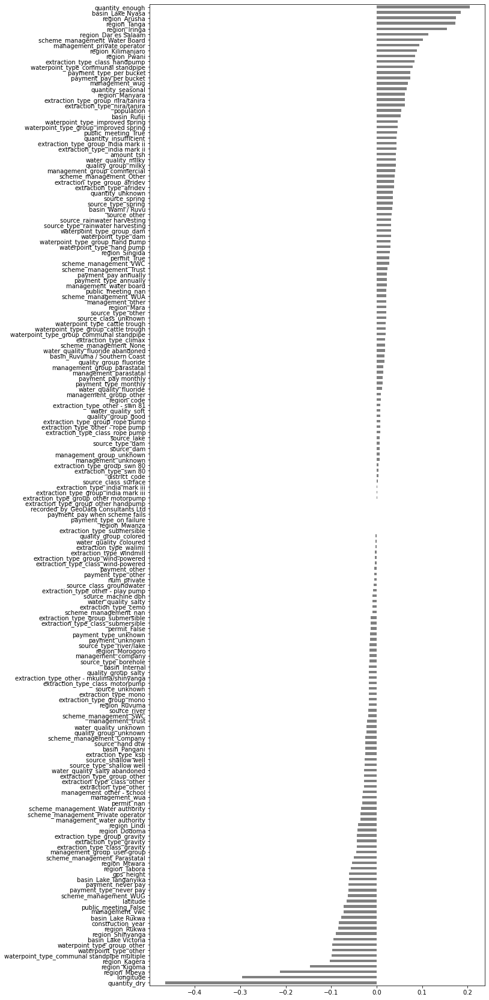

In [309]:
%matplotlib inline
import matplotlib.pyplot as plt

model = pipeline.named_steps['logisticregression']
encoder = pipeline.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns
coefficients = pd.Series(model.coef_[0], encoded_columns)
plt.figure(figsize=(10,30))
coefficients.sort_values().plot.barh(color='grey');

## Challenge

For your assignment, try to use a scikit-learn pipeline. Do you consider it more convenient?

# Use scikit-learn for decision trees

## Overview

In this Unit, we learn about two "families" or types of models: Linear Models, and Trees.

We'll start today with using [Decision Trees](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/), then understanding how they work. (See the Sources heading at the bottom of the notebook for lots of great links!)

Later, we'll learn about Random Forests, and Gradient Boosted Trees, which are "ensemble" models made of many trees. In practice, these "Tree Ensembles" are used more often than a single Decision Tree. 

But we start with a single Tree because it's a helpful prerequisite for understanding Tree Ensembles. Also, a single, shallow decision tree is a useful baseline.

## Follow Along

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

We will start with default parameters, including:
- `max_depth=None`
- `min_samples_leaf=1`

In [310]:
from sklearn.tree import DecisionTreeClassifier

pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(strategy='mean'), 
    DecisionTreeClassifier(random_state=42)
)

# Fit on train
pipeline.fit(X_train, y_train)

# Score on validation
print ('Train Accuracy', pipeline.score(X_train, y_train))
print ('Validation Accuracy', pipeline.score(X_val, y_val))

# Predict on test
y_pred = pipeline.predict(X_test)
y_pred

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Train Accuracy 0.9954755892255892
Validation Accuracy 0.7594276094276095


array(['non functional', 'functional needs repair', 'functional', ...,
       'functional', 'functional', 'non functional'], dtype=object)

### Plot the decision tree with graphviz

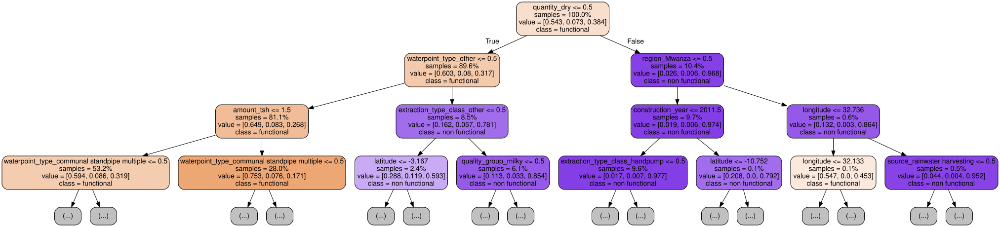

In [311]:
# Plot tree
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
import graphviz
from sklearn.tree import export_graphviz

model = pipeline.named_steps['decisiontreeclassifier']
encoder = pipeline.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns

dot_data = export_graphviz(model, 
                           out_file=None, 
                           max_depth=3, 
                           feature_names=encoded_columns,
                           class_names=model.classes_, 
                           impurity=False, 
                           filled=True, 
                           proportion=True, 
                           rounded=True)   
display(graphviz.Source(dot_data))

### Reduce complexity of the decision tree

We can use the `min_samples_leaf` parameter to reduce model complexity.

It's explained in [scikit-learn docs](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

Also in [A Visual Introduction to Machine Learning, Part 2](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/):

> Models can be adjusted to change the way they fit the data. These 'settings' are called [hyper]parameters. An example of a decision-tree [hyper]parameter is the _minimum node size,_ which regulates the creation of new splits. A node will not split if the number of data points it contains is below the minimum node size.

In [312]:
# Let's increse min_sample_leaf to 20
pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(strategy='mean'), 
    DecisionTreeClassifier(min_samples_leaf=20, random_state=42)
)

# Fit on train
pipeline.fit(X_train, y_train)

# Score on validation
print ('Train Accuracy', pipeline.score(X_train, y_train))
print ('Validation Accuracy', pipeline.score(X_val, y_val))

# Predict on test
y_pred = pipeline.predict(X_test)

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Train Accuracy 0.8067129629629629
Validation Accuracy 0.7692760942760942


## Challenge

Fit a Decision Tree classifier to make new submissions for your Kaggle challenge.

# Get and interpret feature importances of a tree-based model

## Feature importances

Linear models have coefficients, but trees don't. Instead, they have "feature importances."

Feature importances are always positive numbers, they don't have a sign. Feature importance measures how **early & often** a feature is used for the tree's "branching" decisions. 

Like most predictive modeling tools and techniques, feature importances are useful, but have tradeoffs, make assumptions, and can be misinterpreted. We'll continue to discuss through this lesson and the unit.

## Follow Along

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

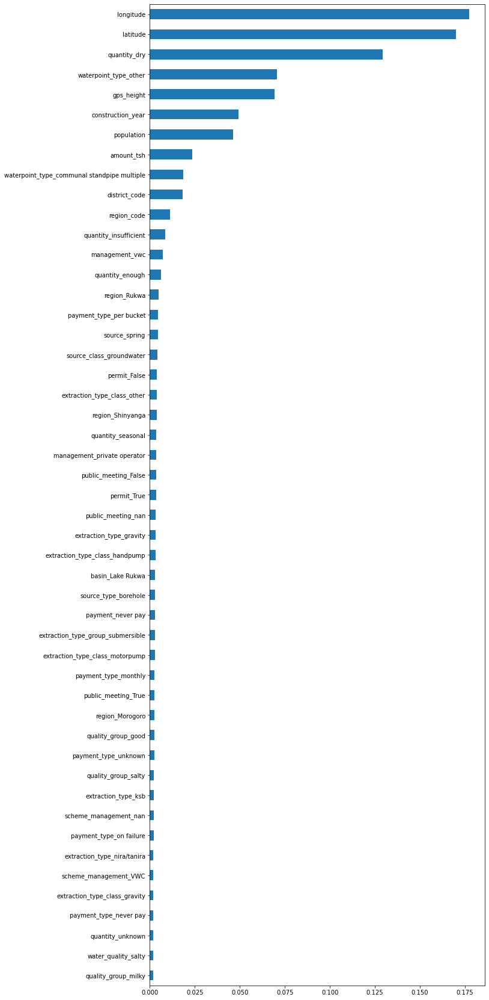

In [313]:
# Linear models have coefficients, 
# but trees have "feature importances"

encoder = pipeline.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns
importances = pd.Series(data=model.feature_importances_, index=encoded_columns)
plt.figure(figsize=(10,30))
importances.sort_values(ascending=True)[-1:-50:-1].plot.barh().invert_yaxis()

In [314]:
importances.sort_values(ascending=True)[:-10:-1]

longitude                                      0.177182
latitude                                       0.169936
quantity_dry                                   0.129443
waterpoint_type_other                          0.070546
gps_height                                     0.069201
construction_year                              0.049390
population                                     0.046286
amount_tsh                                     0.023710
waterpoint_type_communal standpipe multiple    0.018624
dtype: float64

# Understand why decision trees are useful to model non-linear, non-monotonic relationships and feature interactions

## Overview

#### What does _(non)monotonic_ mean?!?!
- See Figures 1-3 in Wikipedia's article, [Monotonic function](https://en.wikipedia.org/wiki/Monotonic_function)
- See [World Population Growth, 1700-2010](https://ourworldindata.org/world-population-growth-past-future). World Population is non-linear and monotonic. Annual growth rate is non-linear and non-monotonic.
- See [Accidents per Mile Driven, by Driver Age](http://howwedrive.com/2009/02/20/whats-the-real-risk-of-older-drivers/). This is non-linear and non-monotonic.

#### What does _feature interactions_ mean?!?!
- See the explanation in [_Interpretable Machine Learning,_ Chapter 5.4.1, Feature Interaction](https://christophm.github.io/interpretable-ml-book/interaction.html#feature-interaction).
- See the exploration in this notebook, under the heading ***Example #3: Simple housing***

## Follow Along
**Linear classifiers do not work well for non-monotinic and non linear behaviour. Tree based classifier seems is a better choice in those cases.**

### Example 1: Predict which waterpumps are functional, just based on location
There is no linear relationship between location and pump functionality. So linear models is not suitable
(2 features, non-linear, feature interactions, classification)

### Compare a Logistic Regression with 2 features, longitude & latitude ...

In [315]:
X_train.columns.tolist()

['amount_tsh',
 'gps_height',
 'longitude',
 'latitude',
 'num_private',
 'region_code',
 'district_code',
 'population',
 'construction_year',
 'basin',
 'region',
 'public_meeting',
 'recorded_by',
 'scheme_management',
 'permit',
 'extraction_type',
 'extraction_type_group',
 'extraction_type_class',
 'management',
 'management_group',
 'payment',
 'payment_type',
 'water_quality',
 'quality_group',
 'quantity',
 'source',
 'source_type',
 'source_class',
 'waterpoint_type',
 'waterpoint_type_group']

In [316]:
train_location = X_train[['longitude', 'latitude']].copy()
val_location = X_val[['longitude', 'latitude']].copy()

*No need for the encoder as both feature are numeric*

In [317]:
# With just long & lat, a Logistic Regression can't beat the majority classifier baseline

lr = make_pipeline(
    SimpleImputer(),
    StandardScaler(),
    LogisticRegression(solver='lbfgs', multi_class='auto', n_jobs=-1)
)

lr.fit(train_location, y_train)
print('Logistic Regression:')
print('Train Accuracy', lr.score(train_location, y_train))
print('Validation Accuracy', lr.score(val_location, y_val))

Logistic Regression:
Train Accuracy 0.5430765993265994
Validation Accuracy 0.5430976430976431


### ... versus a Decision Tree Classifier with 2 features, longitude & latitude

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

In [318]:
# With the same 2 features, the Decision Tree's validation accuracy is 
# almost 10 percentage points better

from sklearn.tree import DecisionTreeClassifier

# StandardScaler() is optional, however, Imputer is needed to deal with Nan 
dt = make_pipeline(
    SimpleImputer(),
    StandardScaler(),
    DecisionTreeClassifier(max_depth=16, random_state=42)
)

dt.fit(train_location, y_train)
print('Decision Tree:')
print('Train Accuracy', dt.score(train_location, y_train))
print('Validation Accuracy', dt.score(val_location, y_val))

Decision Tree:
Train Accuracy 0.7969276094276094
Validation Accuracy 0.6473063973063973


### Visualize the logistic regression predictions

In [319]:
%matplotlib inline
import itertools
from math import floor
import matplotlib.pyplot as plt
import seaborn as sns

def pred_heatmap(model, X, features, class_index=-1, title='', num=100):
    """
    Visualize predicted probabilities, for classifier fit on 2 numeric features
    
    Parameters
    ----------
    model : scikit-learn classifier, already fit
    X : pandas dataframe, which was used to fit model
    features : list of strings, column names of the 2 numeric features
    class_index : integer, index of class label
    title : string, title of plot
    num : int, number of grid points for each feature
    """
    feature1, feature2 = features
    min1, max1 = X[feature1].min(), X[feature1].max()
    min2, max2 = X[feature2].min(), X[feature2].max()
    x1 = np.linspace(min1, max1, num)
    x2 = np.linspace(max2, min2, num)
    combos = list(itertools.product(x1, x2))
    y_pred_proba = model.predict_proba(combos)[:, class_index]
    pred_grid = y_pred_proba.reshape(num, num).T
    table = pd.DataFrame(pred_grid, columns=x1, index=x2)
    plot_every_n_ticks = int(floor(num/4))
    sns.heatmap(table, # vmin=0, vmax=1, 
                xticklabels=plot_every_n_ticks, 
                yticklabels=plot_every_n_ticks)
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.title(title)
    plt.show()

*Let's run a test to verify that grid indices are assigned correctly*

In [320]:
# Creating plot grid pponts
x1 = np.linspace(0.1, 3/7, 3)
x2 = np.linspace(5, 3, 3)
combos = list(itertools.product(x1, x2))
Xa = np.array(combos)
combos

[(0.1, 5.0),
 (0.1, 4.0),
 (0.1, 3.0),
 (0.26428571428571423, 5.0),
 (0.26428571428571423, 4.0),
 (0.26428571428571423, 3.0),
 (0.42857142857142855, 5.0),
 (0.42857142857142855, 4.0),
 (0.42857142857142855, 3.0)]

Here we have 9 observations:

(x1_1, x2_1),

(x1_1, x2_2),

(x1_1, x2_3),

.

.

.

(x1_3, x2_1),

(x1_3, x2_2),

(x1_3, x2_3)

*emulating model .predict_proba_ method*

In [321]:
(Xa*1).dot([1,0.1]).reshape(-1,1)

array([[0.6       ],
       [0.5       ],
       [0.4       ],
       [0.76428571],
       [0.66428571],
       [0.56428571],
       [0.92857143],
       [0.82857143],
       [0.72857143]])

*Proba values for 3 classes and 9 observations*

In [322]:
predict_proba_test = np.hstack(((Xa.dot([1,0.1])).reshape(-1,1), ((Xa*10).dot([1,0.1])).reshape(-1,1), ((Xa*100).dot([1,0.1])).reshape(-1,1)))
print(predict_proba_test.shape)
predict_proba_test

(9, 3)


array([[ 0.6       ,  6.        , 60.        ],
       [ 0.5       ,  5.        , 50.        ],
       [ 0.4       ,  4.        , 40.        ],
       [ 0.76428571,  7.64285714, 76.42857143],
       [ 0.66428571,  6.64285714, 66.42857143],
       [ 0.56428571,  5.64285714, 56.42857143],
       [ 0.92857143,  9.28571429, 92.85714286],
       [ 0.82857143,  8.28571429, 82.85714286],
       [ 0.72857143,  7.28571429, 72.85714286]])

In [323]:
pred_grid_test = predict_proba_test[:,0].reshape(3, 3).T
pred_grid_test  

array([[0.6       , 0.76428571, 0.92857143],
       [0.5       , 0.66428571, 0.82857143],
       [0.4       , 0.56428571, 0.72857143]])

**x1 changes along axis=1, x2 changes along axis=0**

In [324]:
table_test = pd.DataFrame(pred_grid_test, columns=x1, index=x2)
table_test

,0.100000,0.264286,0.428571
5.0,0.6,0.764286,0.928571
4.0,0.5,0.664286,0.828571
3.0,0.4,0.564286,0.728571


<AxesSubplot:>

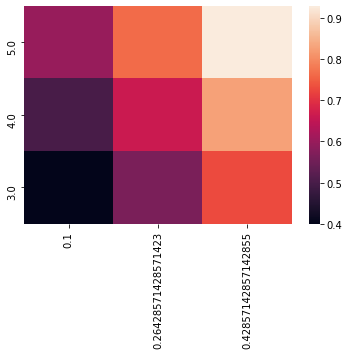

In [325]:
sns.heatmap(table_test, xticklabels=1, yticklabels=1)

### Now let's run the function and plot the heatmap

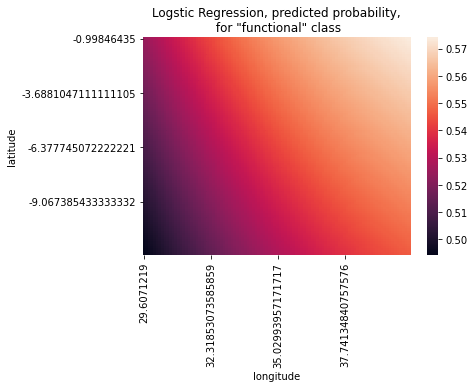

In [326]:
pred_heatmap(lr, train_location, features=['longitude', 'latitude'], 
             class_index=0, title='Logstic Regression, predicted probability,\n for "functional" class')

*LogisticRegression tries to offer a linear solution to an inherently non-linear problem, and badly fails*

In [327]:
pd.Series(lr.named_steps['logisticregression'].coef_[0], 
          train_location.columns)

longitude    0.106718
latitude     0.022948
dtype: float64

### Visualize the decision tree predictions

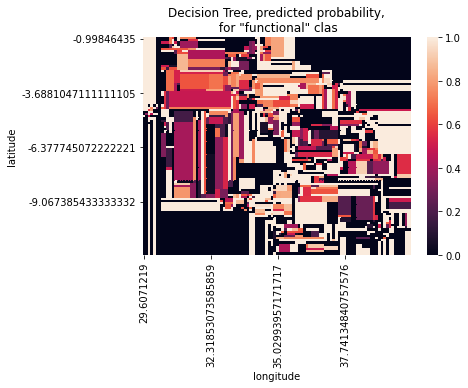

In [328]:
pred_heatmap(dt, train_location, features=['longitude', 'latitude'], 
             class_index=0, title='Decision Tree, predicted probability,\n for "functional" clas')

*DecisionTreeClassifier create a highly non-linear decision tree and overfits to the training set*

### How does a tree grow? Branch by branch!

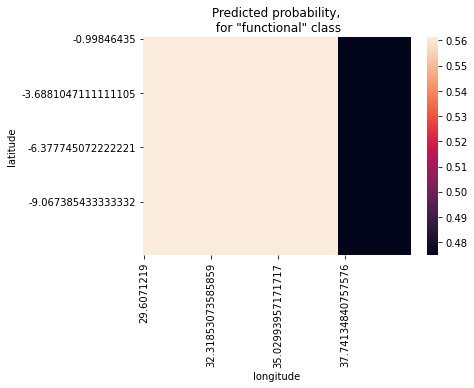

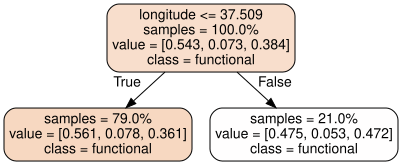

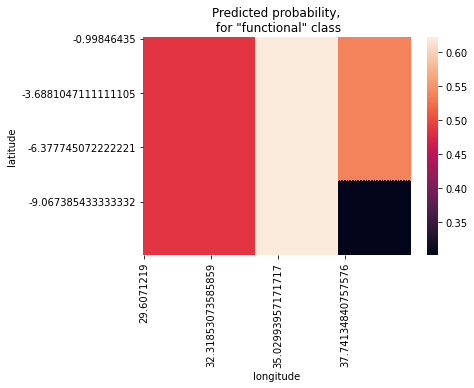

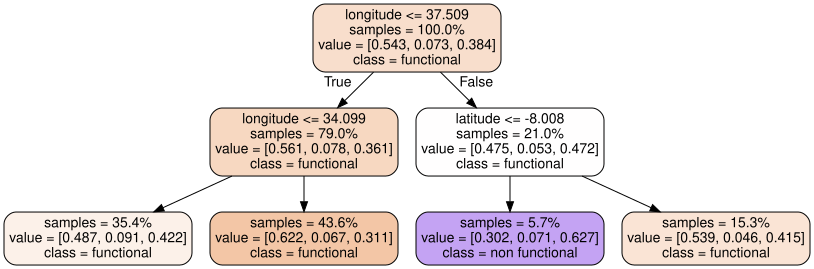

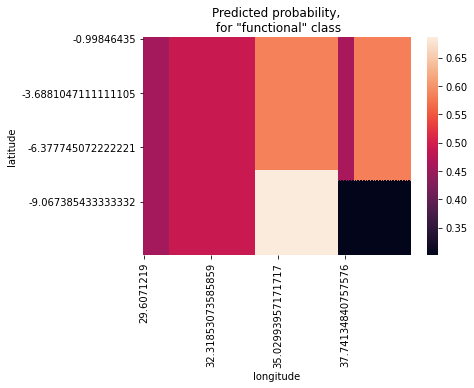

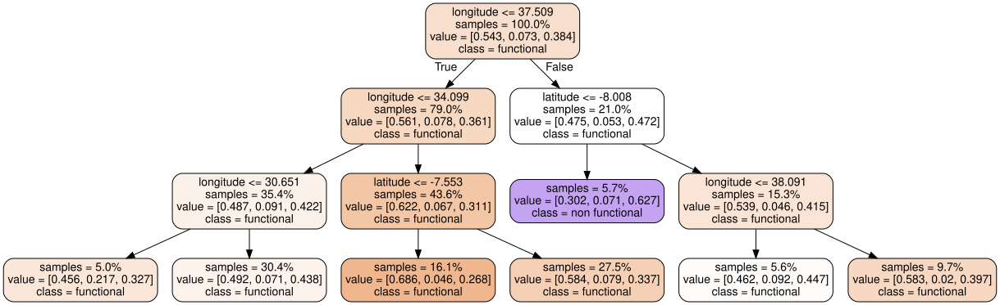

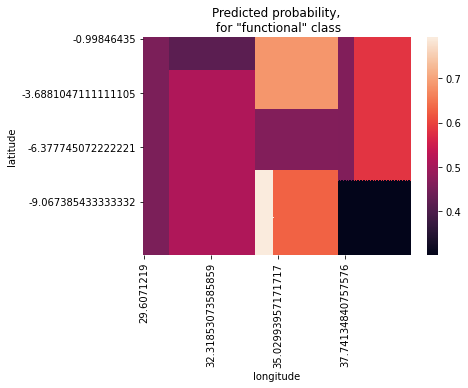

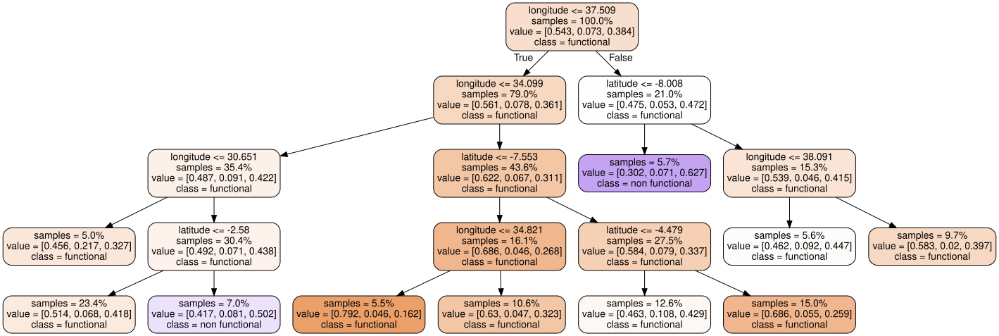

In [329]:
from IPython.display import display, HTML
import graphviz
from sklearn.tree import export_graphviz

for max_depth in [1,2,3,4]:
    
    # Fit decision tree
    dt = make_pipeline(
        SimpleImputer(), 
        DecisionTreeClassifier(max_depth=max_depth, random_state=42, min_samples_leaf=0.05)
    )
    dt.fit(train_location, y_train)
    
    # Display depth & scores
    display(HTML(f'Max Depth {max_depth}'))
    display(HTML(f'Train Accuracy {dt.score(train_location, y_train):.2f}'))
    display(HTML(f'Validation Accuracy {dt.score(val_location, y_val):.2f}'))
    
    # Plot heatmap of predicted probabilities
    pred_heatmap(dt, train_location, features=['longitude', 'latitude'], 
                 class_index=0, title='Predicted probability,\n for "functional" class')
    
    # Plot tree
    # https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
    dot_data = export_graphviz(dt.named_steps['decisiontreeclassifier'], 
                               out_file=None, 
                               max_depth=max_depth, 
                               feature_names=train_location.columns,
                               class_names=dt.classes_, 
                               impurity=False, 
                               filled=True, 
                               proportion=True, 
                               rounded=True)   
    display(graphviz.Source(dot_data))

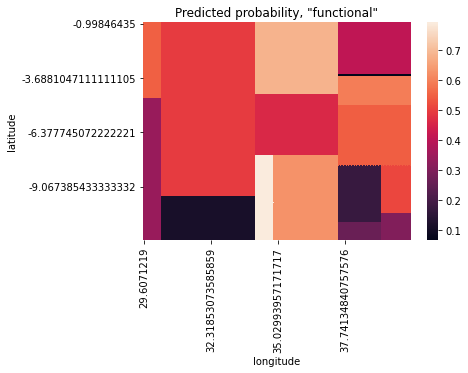

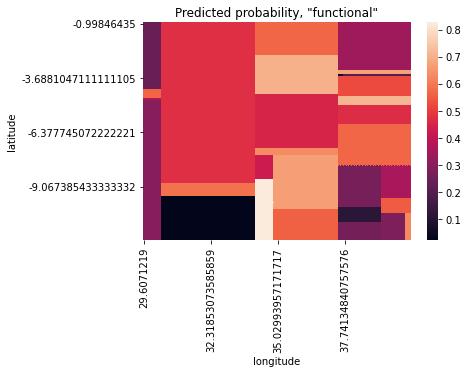

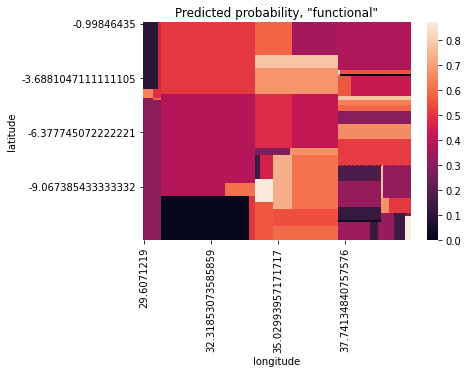

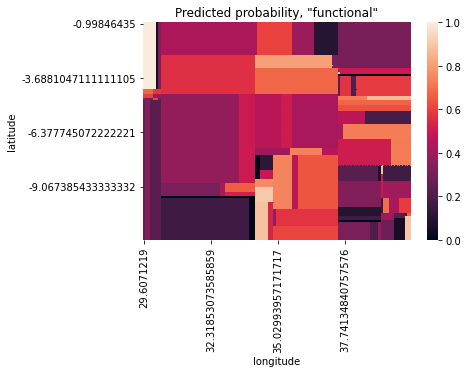

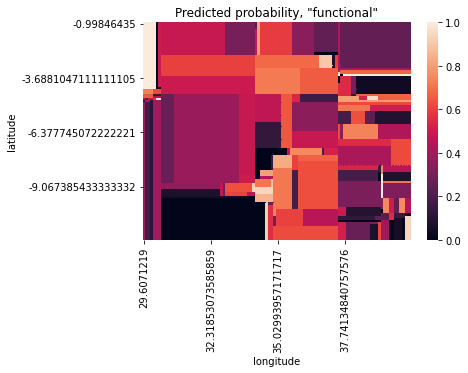

...

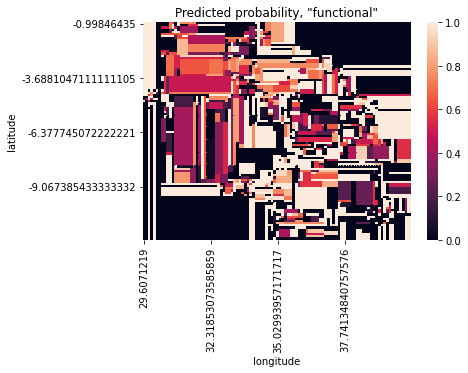

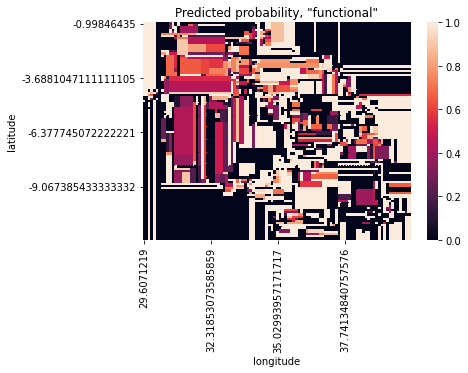

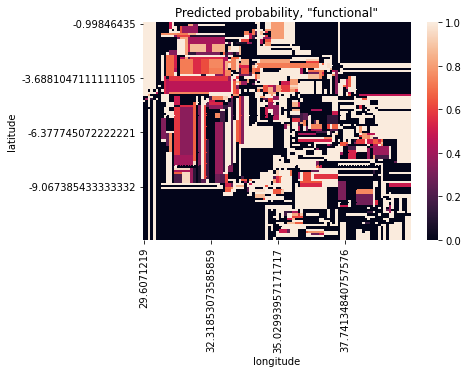

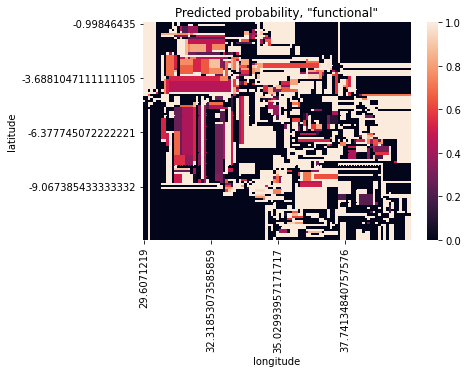

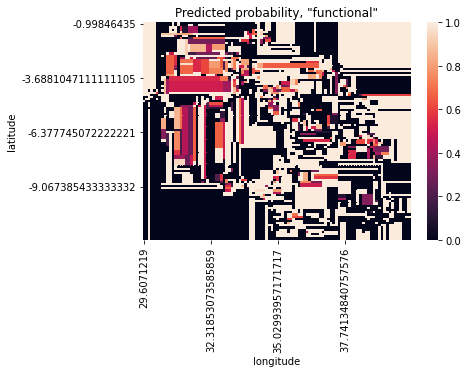

In [330]:
for max_depth in range(4,21):
    
    # Fit decision tree
    dt = make_pipeline(
        SimpleImputer(), 
        DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    )
    dt.fit(train_location, y_train)
    
    # Display depth & scores
    display(HTML(f'Max Depth {max_depth}'))
    display(HTML(f'Train Accuracy {dt.score(train_location, y_train):.2f}'))
    display(HTML(f'Validation Accuracy {dt.score(val_location, y_val):.2f}'))
    
    # Plot heatmap of predicted probabilities
    pred_heatmap(dt, train_location, features=['longitude', 'latitude'], 
                 class_index=0, title='Predicted probability, "functional"')

## Example 2: predicting golf putts
(1 feature, non-linear, regression).

https://statmodeling.stat.columbia.edu/2008/12/04/the_golf_puttin/

(19, 4)

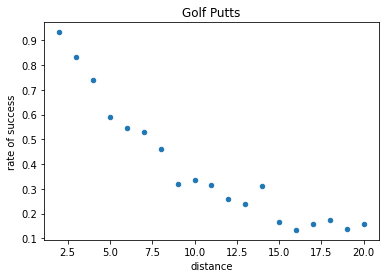

In [331]:
columns = ['distance', 'tries', 'successes']
data = [[2, 1443, 1346],
        [3, 694, 577],
        [4, 455, 337],
        [5, 353, 208],
        [6, 272, 149],
        [7, 256, 136],
        [8, 240, 111],
        [9, 217, 69],
        [10, 200, 67],
        [11, 237, 75],
        [12, 202, 52],
        [13, 192, 46],
        [14, 174, 54],
        [15, 167, 28],
        [16, 201, 27],
        [17, 195, 31],
        [18, 191, 33],
        [19, 147, 20],
        [20, 152, 24]]

putts = pd.DataFrame(columns=columns, data=data)
putts['rate of success'] = putts['successes'] / putts['tries']
putts.plot('distance', 'rate of success', kind='scatter', title='Golf Putts');
putts.shape

#### Compare Linear Regression ... 

R^2 Score 0.8695850610243295


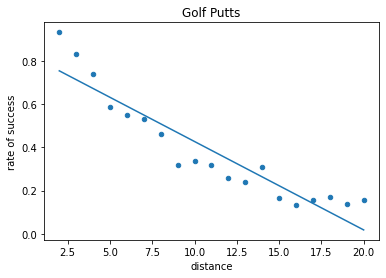

In [332]:
from sklearn.linear_model import LinearRegression

putts_X = putts[['distance']]
putts_y = putts['rate of success']
lr = LinearRegression()
lr.fit(putts_X, putts_y)
print('R^2 Score', lr.score(putts_X, putts_y))
ax = putts.plot('distance', 'rate of success', kind='scatter', title='Golf Putts')
ax.plot(putts_X, lr.predict(putts_X));

#### ... versus a Decision Tree Regressor
**Input feature is distance and the target is rate of success.**

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html

max depth: 1
R^2 Score 0.7699444359350168


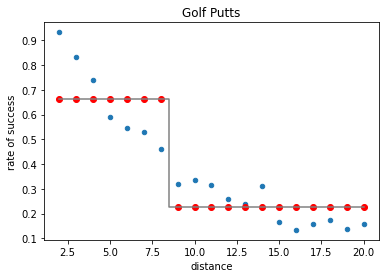

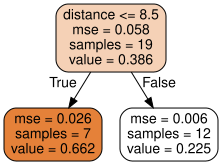

max depth: 2
R^2 Score 0.9676848646593703


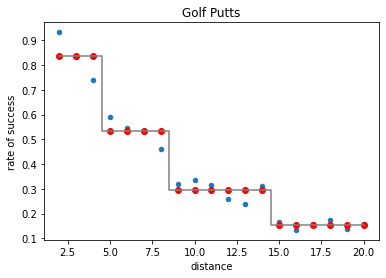

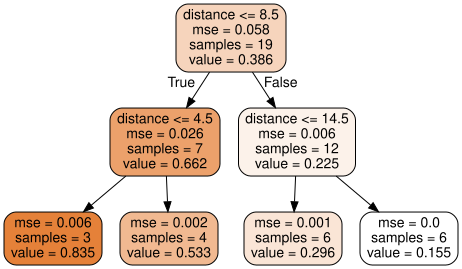

max depth: 3
R^2 Score 0.9909616122379781


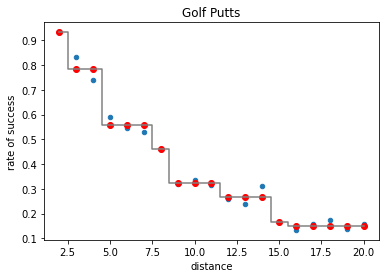

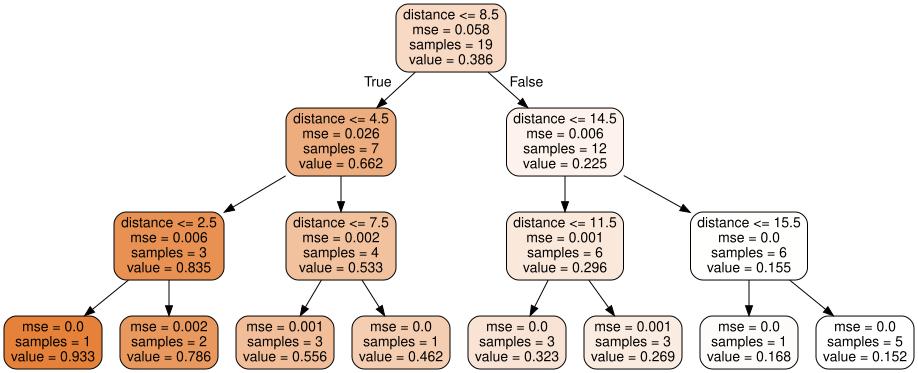

max depth: 4
R^2 Score 0.9989670678545639


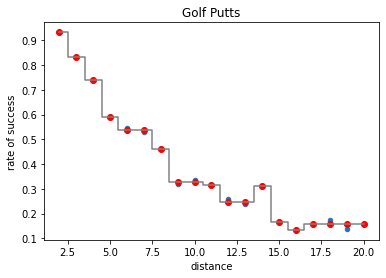

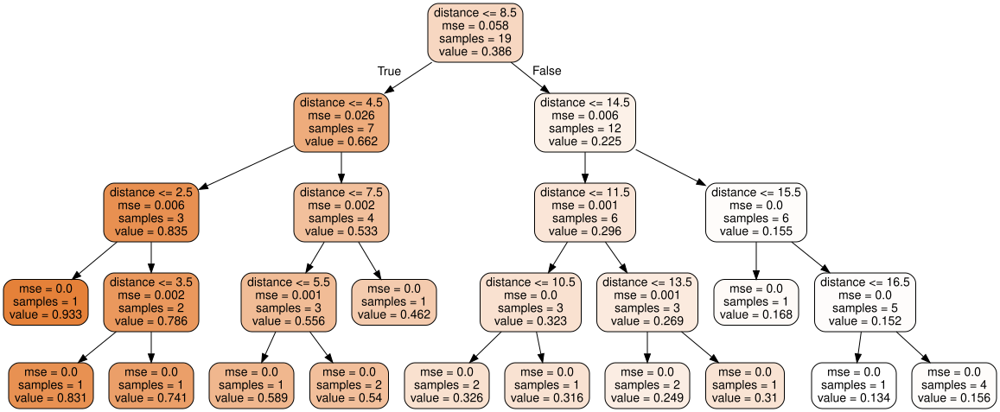

max depth: 5
R^2 Score 0.9996954629942487


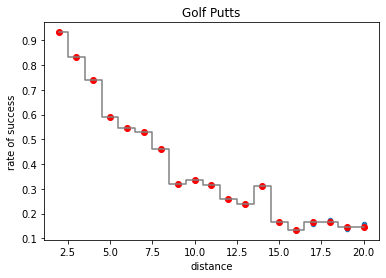

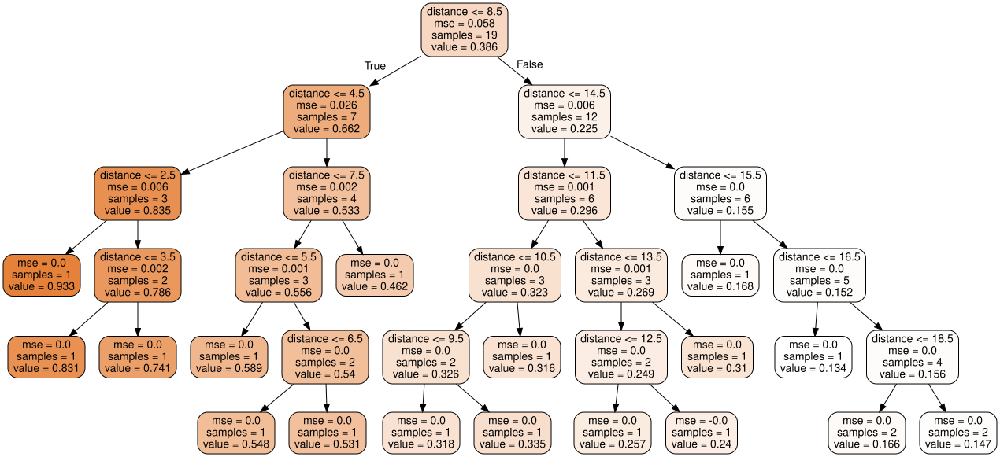

In [333]:
import graphviz
from ipywidgets import interact
from sklearn.tree import DecisionTreeRegressor, export_graphviz

def viztree(decision_tree, feature_names):
    dot_data = export_graphviz(decision_tree, out_file=None, feature_names=feature_names, 
                               filled=True, rounded=True)   
    return graphviz.Source(dot_data)

def putts_tree(max_depth=1):
    tree = DecisionTreeRegressor(max_depth=max_depth)
    tree.fit(putts_X, putts_y)
    print(f'max depth: {max_depth}')
    print('R^2 Score', tree.score(putts_X, putts_y))
    ax = putts.plot('distance', 'rate of success', kind='scatter', title='Golf Putts')
    ax.step(putts_X, tree.predict(putts_X), where='mid', c='grey')
    ax.scatter(putts_X, tree.predict(putts_X),c='r')
    plt.show()
    display(viztree(tree, feature_names=['distance']))

# interact(putts_tree, max_depth=(1,6,1));

for maxdepth in range(1,6):
    putts_tree(max_depth=maxdepth)

*The number of dividing levels is 2^max_depth*

## Example 3a: Simple housing 
(2 features, regression)

https://christophm.github.io/interpretable-ml-book/interaction.html#feature-interaction

In [334]:
columns = ['Price', 'Good Location', 'Big Size']

data = [[300000, 1, 1], 
        [200000, 1, 0], 
        [250000, 0, 1], 
        [150000, 0, 0]]

house = pd.DataFrame(columns=columns, data=data)
house

,Price,Good Location,Big Size
0,300000,1,1
1,200000,1,0
2,250000,0,1
3,150000,0,0


#### Compare Linear Regression ... 
**Input feature is "Good Location" and "Big Size" and target is "Price"**

In [335]:
house_X = house.drop(columns='Price')
house_y = house['Price']
lr = LinearRegression()
lr.fit(house_X, house_y)
print('R^2', lr.score(house_X, house_y))
print('Intercept \t', lr.intercept_)
coefficients = pd.Series(lr.coef_, house_X.columns)
print(coefficients.to_string())

R^2 1.0
Intercept 	 150000.0
Good Location     50000.0
Big Size         100000.0


*The regression plane runs through target values. Two parameters completely explain 4 linearly distanced target values*

#### ... versus a Decision Tree Regressor

R^2 1.0


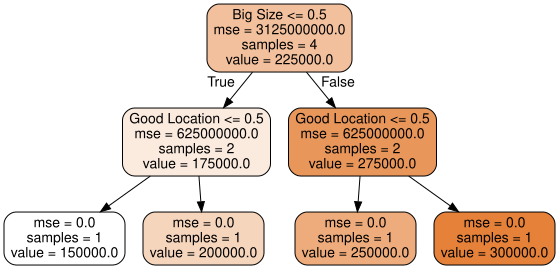

In [336]:
tree = DecisionTreeRegressor()
tree.fit(house_X, house_y)
print('R^2', tree.score(house_X, house_y))
viztree(tree, feature_names=house_X.columns)

## Example 3b: Simple housing, with a twist: _Feature Interaction_

Let's have a situation where one of the target values is not linearly scaled

In [337]:
house.loc[0, 'Price'] = 400000
house_X = house.drop(columns='Price')
house_y = house['Price']
house

,Price,Good Location,Big Size
0,400000,1,1
1,200000,1,0
2,250000,0,1
3,150000,0,0


#### Compare Linear Regression ... 

In [338]:
lr = LinearRegression()
lr.fit(house_X, house_y)
print('R^2', lr.score(house_X, house_y))
print('Intercept \t', lr.intercept_)
coefficients = pd.Series(lr.coef_, house_X.columns)
print(coefficients.to_string())

R^2 0.9285714285714286
Intercept 	 125000.0
Good Location    100000.0
Big Size         150000.0


R2 score is less than perfect

#### ... versus a Decision Tree Regressor

R^2 1.0


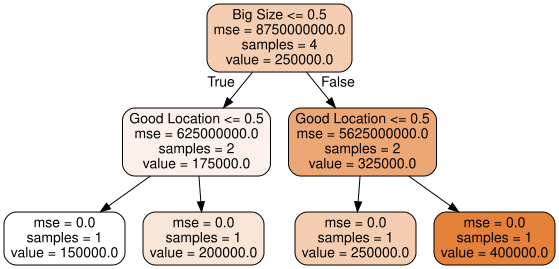

In [339]:
tree = DecisionTreeRegressor()
tree.fit(house_X, house_y)
print('R^2', tree.score(house_X, house_y))
viztree(tree, feature_names=house_X.columns)

DecisionTreeRegressor is a non-linear structure that maintains R2 score of 1.

# Sources

- A Visual Introduction to Machine Learning
  - [Part 1: A Decision Tree](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/)
  - [Part 2: Bias and Variance](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/)
- [Decision Trees: Advantages & Disadvantages](https://christophm.github.io/interpretable-ml-book/tree.html#advantages-2)
- [How a Russian mathematician constructed a decision tree — by hand — to solve a medical problem](http://fastml.com/how-a-russian-mathematician-constructed-a-decision-tree-by-hand-to-solve-a-medical-problem/)
- [How decision trees work](https://brohrer.github.io/how_decision_trees_work.html)
- [Let’s Write a Decision Tree Classifier from Scratch](https://www.youtube.com/watch?v=LDRbO9a6XPU) — _Don’t worry about understanding the code, just get introduced to the concepts. This 10 minute video has excellent diagrams and explanations._
- [Random Forests for Complete Beginners: The definitive guide to Random Forests and Decision Trees](https://victorzhou.com/blog/intro-to-random-forests/)